In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%cd '/content/drive/MyDrive/Project'

/content/drive/.shortcut-targets-by-id/11CaULD0eo2bzOUTXLY-_ejaxtRENy7I7/Project


In [3]:
!pip uninstall keras -y
!pip uninstall keras-nightly -y
!pip uninstall keras-Preprocessing -y
!pip uninstall keras-vis -y
!pip uninstall tensorflow -y
!pip uninstall h5py -y

Found existing installation: Keras 2.1.0
Uninstalling Keras-2.1.0:
  Successfully uninstalled Keras-2.1.0
Found existing installation: Keras-Preprocessing 1.1.2
Uninstalling Keras-Preprocessing-1.1.2:
  Successfully uninstalled Keras-Preprocessing-1.1.2
Found existing installation: tensorflow 1.13.1
Uninstalling tensorflow-1.13.1:
  Successfully uninstalled tensorflow-1.13.1
Found existing installation: h5py 2.10.0
Uninstalling h5py-2.10.0:
  Successfully uninstalled h5py-2.10.0


In [4]:
!pip install tensorflow==1.13.1
!pip install keras==2.1.0
!pip install h5py==2.10.0

  Using cached tensorflow-1.13.1-cp37-cp37m-manylinux1_x86_64.whl (92.6 MB)
  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl (42 kB)
  Using cached h5py-3.6.0-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (4.1 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
kapre 0.3.6 requires tensorflow>=2.0.0, but you have tensorflow 1.13.1 which is incompatible.
  Using cached Keras-2.1.0-py2.py3-none-any.whl (302 kB)
  Using cached h5py-2.10.0-cp37-cp37m-manylinux1_x86_64.whl (2.9 MB)
  Attempting uninstall: h5py
    Found existing installation: h5py 3.6.0
    Uninstalling h5py-3.6.0:
      Successfully uninstalled h5py-3.6.0


In [9]:
import warnings
warnings.filterwarnings('ignore')
import os
import sys
import json
import datetime
import numpy as np
import skimage.draw
import cv2
import random
import math
import re
import time
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.visualize import display_instances
import mrcnn.model as modellib
from mrcnn.model import log
from mrcnn.config import Config
from mrcnn import model as modellib, utils
import skimage.draw
import numpy as np
from array import *

In [10]:
WEIGHTS_PATH = os.path.join("/content/drive/MyDrive/Project/logs/object20211128T0634/mask_rcnn_object_0600.h5")

DEFAULT_LOGS_DIR = os.path.join("/content/drive/MyDrive/Project", "logs")

In [11]:
class CustomConfig(Config):
    """Configuration for training on the custom  dataset.
    Derives from the base Config class and overrides some values.
    """
    # Give the configuration a recognizable name
    NAME = "object"

    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 3  # Background + phone,laptop and mobile

    # Number of training steps per epoch
    STEPS_PER_EPOCH = 10

    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.9

    IMAGE_MIN_DIM = 640

    VALIDATION_STEPS = 10

In [12]:
class CustomDataset(utils.Dataset):

    def load_custom(self, dataset_dir, subset):
        """Load a subset of the Dog-Cat dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("object", 1, "burr")
        self.add_class("object", 2, "groove")
        self.add_class("object", 3, "diagonal")
        # self.add_class("object", 2, "Man")

        self.image_path = []

        # Train or validation dataset?
        assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)

        # Load annotations
        # VGG Image Annotator saves each image in the form:
        # { 'filename': '28503151_5b5b7ec140_b.jpg',
        #   'regions': {
        #       '0': {
        #           'region_attributes': {},
        #           'shape_attributes': {
        #               'all_points_x': [...],
        #               'all_points_y': [...],
        #               'name': 'polygon'}},
        #       ... more regions ...
        #   },
        #   'size': 100202
        # }
        # We mostly care about the x and y coordinates of each region
        self.annotations1 = []
        # path = os.path.join("/content/drive/MyDrive/Project/Data/train","Path.txt")
        path = os.path.join(dataset_dir,"Path2.txt")
        path = open(path)
        for x in path:
            x = x.replace('\n', '')
            if x.lower().endswith(('.jpg', '.png', '.jpeg')):
                self.image_path.append(x)
            elif x.lower().endswith('.json'):
                self.annotations1.append(x)

        print("images = ",len(self.image_path))
        print("Annotations = ",len(self.annotations1))

        # annotations1 = json.load(open('D:/MaskRCNN-main/Dataset/train/via_project.json'))
        # annotations = list(annotations1.values())  # don't need the dict keys

        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        # annotations = [a for a in annotations if a['shapes']]

        # print(annotations)
        
        # Add images
        for i in range(len(self.image_path)-10):#len(self.image_path)):
            x = self.annotations1[i]
            with open(x) as f:
                a = json.load(f)
            # print(data)
            # Get the x, y coordinaets of points of the polygons that make up
            # the outline of each object instance. There are stores in the
            # shape_attributes (see json format above)
            polygons = [(np.stack(r['points'], axis=1)).tolist() for r in a['shapes']] 
            objects = [s['label'] for s in a['shapes']]
            print("Index = ", i)
            # print("objects:",objects)
            # print("Points:",polygons)
    #         #name_dict = {"laptop": 1,"tab": 2,"phone": 3}
            name_dict = {"burr": 1,"groove": 2 ,"diagonal": 3}
    #         # key = tuple(name_dict)
            num_ids = [name_dict[a] for a in objects]
     
    #         # num_ids = [int(n['Event']) for n in objects]
    #         # load_mask() needs the image size to convert polygons to masks.
    #         # Unfortunately, VIA doesn't include it in JSON, so we must read
    #         # the image. This is only managable since the dataset is tiny.
            # print("numids",num_ids)
            image_path = self.image_path[i]
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]

            self.add_image(
                "object",  ## for a single class just add the name here
                image_id=a['imagePath'],  # use file name as a unique image id
                path=image_path,
                width=width, height=height,
                polygons=polygons,
                num_ids=num_ids
                )

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a Dog-Cat dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)

    #     # Convert polygons to a bitmap mask of shape
    #     # [height, width, instance_count]
        info = self.image_info[image_id]
        if info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)
        num_ids = info['num_ids']
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])], dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
        	# rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            rr, cc = skimage.draw.polygon(p[1], p[0])
            mask[rr, cc, i] = 1


    #     # Return mask, and array of class IDs of each instance. Since we have
    #     # one class ID only, we return an array of 1s
    #     # Map class names to class IDs.
        num_ids = np.array(num_ids, dtype=np.int32)
        return mask, num_ids #np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
    #     """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "object":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

In [13]:
TEST_MODE = "inference"
ROOT_DIR = "/content/drive/MyDrive/Project/Data"

def get_ax(rows=1, cols=1, size = 16):
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

CUSTOM_DIR = "/content/drive/MyDrive/Project/Data"
dataset = CustomDataset()
dataset.load_custom(CUSTOM_DIR, "val")
dataset.prepare()
print("Images:{}\nClasses:{}".format(len(dataset.image_ids), dataset.class_names))

images =  200
Annotations =  200
Index =  0
Index =  1
Index =  2
Index =  3
Index =  4
Index =  5
Index =  6
Index =  7
Index =  8
Index =  9
Index =  10
Index =  11
Index =  12
Index =  13
Index =  14
Index =  15
Index =  16
Index =  17
Index =  18
Index =  19
Index =  20
Index =  21
Index =  22
Index =  23
Index =  24
Index =  25
Index =  26
Index =  27
Index =  28
Index =  29
Index =  30
Index =  31
Index =  32
Index =  33
Index =  34
Index =  35
Index =  36
Index =  37
Index =  38
Index =  39
Index =  40
Index =  41
Index =  42
Index =  43
Index =  44
Index =  45
Index =  46
Index =  47
Index =  48
Index =  49
Index =  50
Index =  51
Index =  52
Index =  53
Index =  54
Index =  55
Index =  56
Index =  57
Index =  58
Index =  59
Index =  60
Index =  61
Index =  62
Index =  63
Index =  64
Index =  65
Index =  66
Index =  67
Index =  68
Index =  69
Index =  70
Index =  71
Index =  72
Index =  73
Index =  74
Index =  75
Index =  76
Index =  77
Index =  78
Index =  79
Index =  80
Index

In [14]:
config = CustomConfig()
model = modellib.MaskRCNN(mode="inference", model_dir=DEFAULT_LOGS_DIR, config=config)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
Use tf.cast instead.


In [15]:
weights_path = WEIGHTS_PATH

print("loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

loading weights  /content/drive/MyDrive/Project/logs/object20211128T0634/mask_rcnn_object_0600.h5
Re-starting from epoch 600


Images: 190
Classes:['BG', 'burr', 'groove', 'diagonal']
1000
Batch size 1
Processing 1 images
image                    shape: (1000, 1000, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


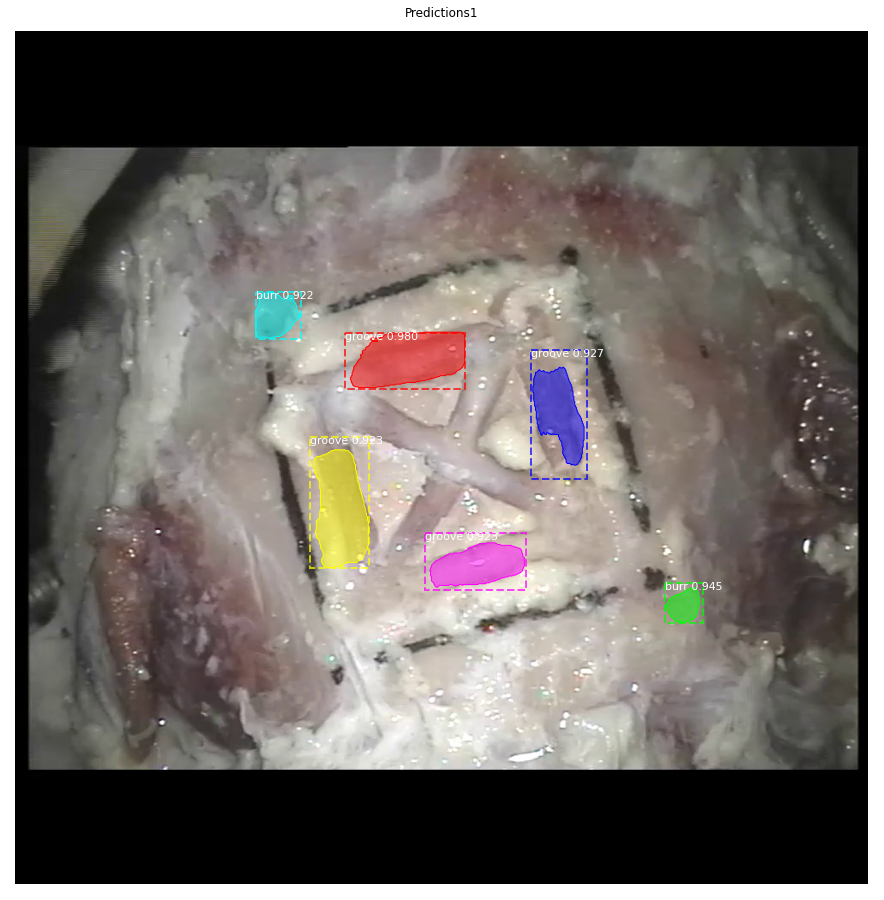

In [21]:
print("Images: {}\nClasses:{}". format(len(dataset.image_ids), dataset.class_names))

path_to_new_image = "/content/drive/MyDrive/Project/Semantic segmentation/Good/Diagonal/frames_compress32_D/frame_0.jpg"
image1 = mpimg.imread(path_to_new_image)

print(len(image1))
print("Batch size",config.BATCH_SIZE)
results1 = model.detect([image1], verbose=1)

ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'], dataset.class_names, r1['scores'], ax=ax, title="Predictions1")

Image ID is :  70
Image ID : object.frame_276.jpg (70) /content/drive/MyDrive/Project/Semantic segmentation/Good/Groove/frames_compress29_S/frame_276.jpg
Processing 1 images
image                    shape: (640, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (4,)                  min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (4, 4)                min:   12.00000  max:  342.00000  int32
gt_mask                  shape: (640, 640, 4)         min:    0.00000  max:    1.00000  bool
Image ID is :  85
Image ID : object.frame_280.jpg (85) /content/drive/MyDrive/Project/Semantic segmentation/Good/Groove/frames_compress40.mov/frame_280.jpg
Processin

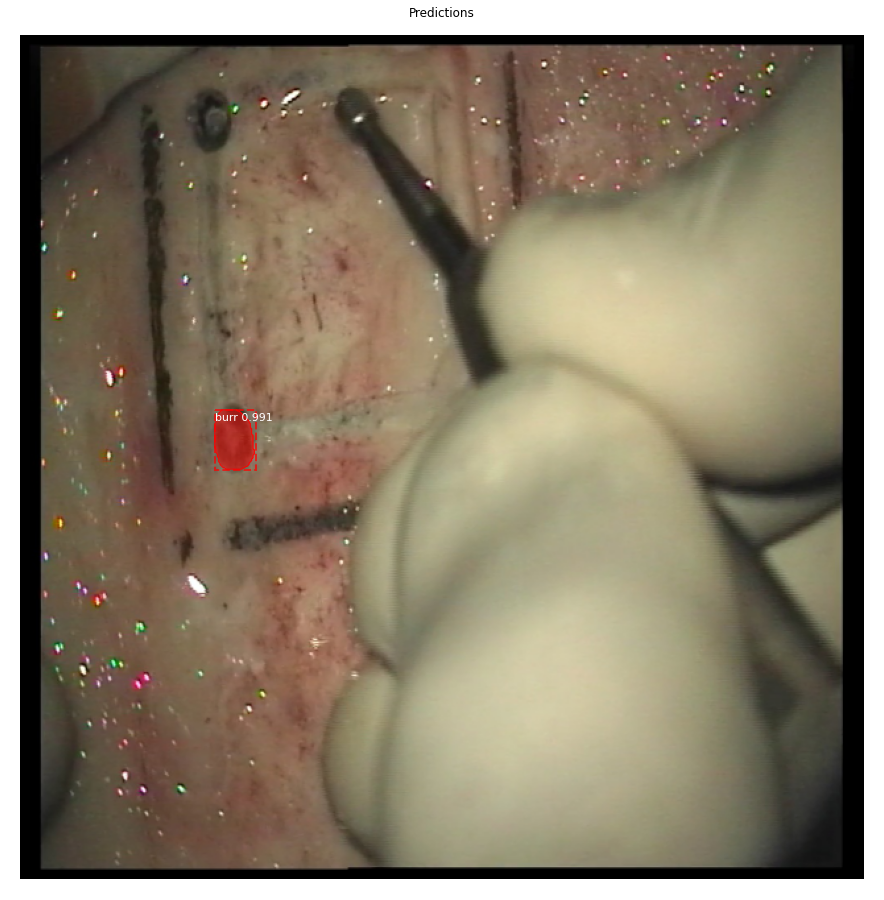

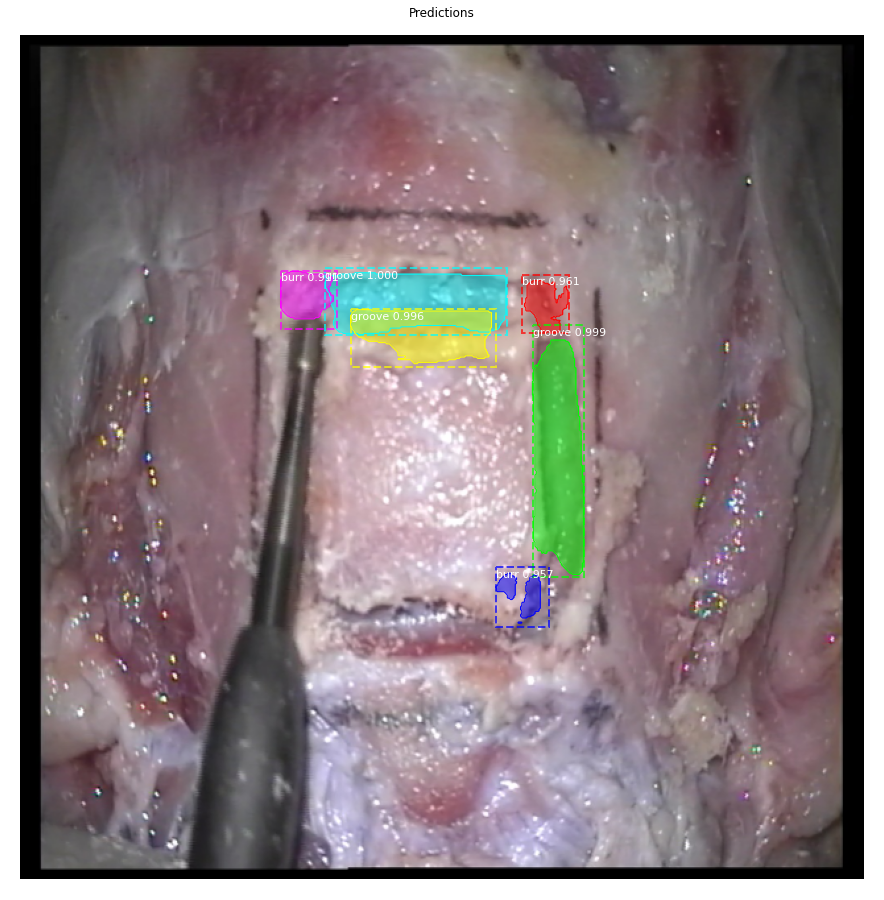

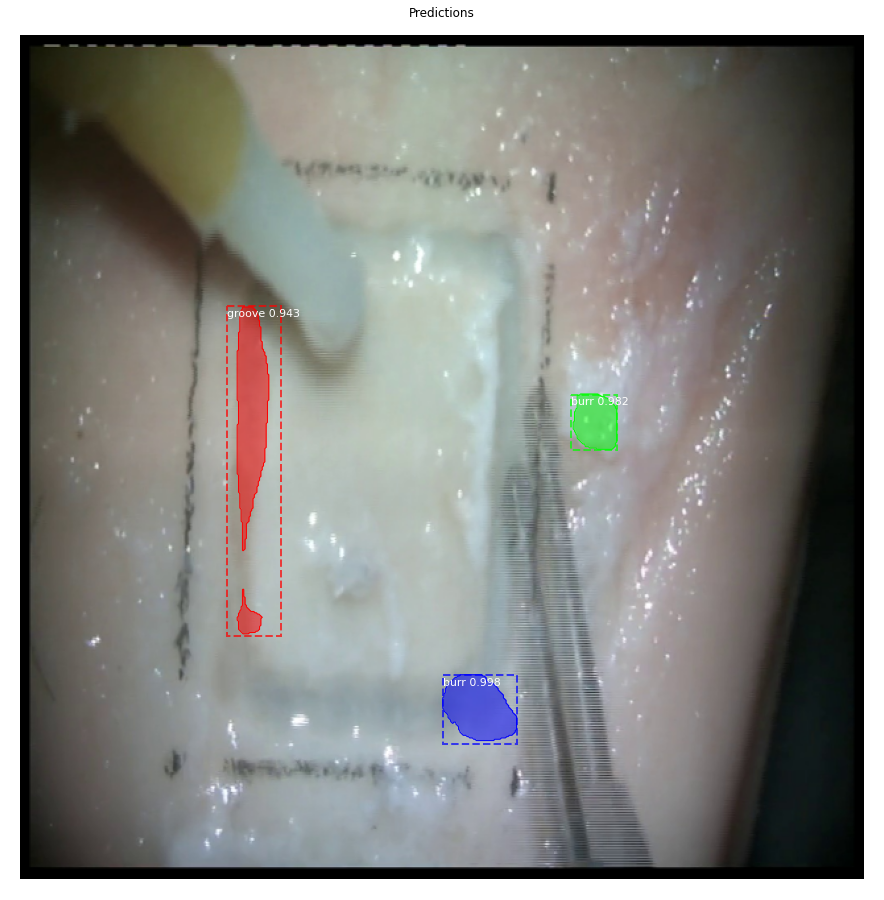

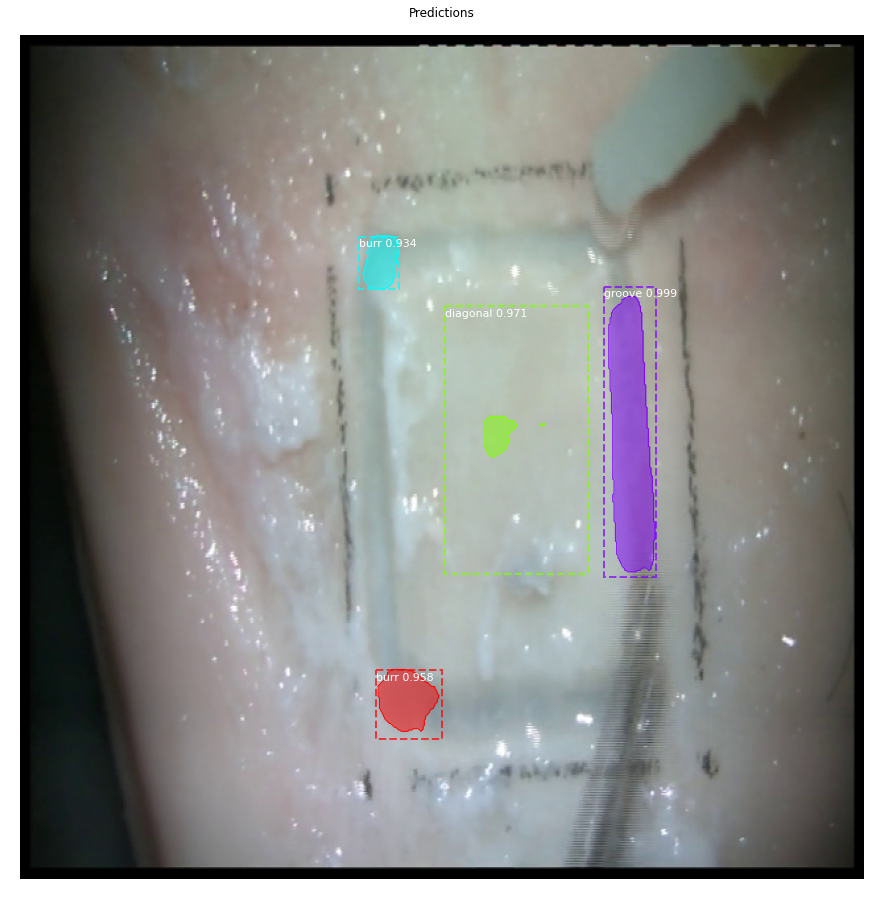

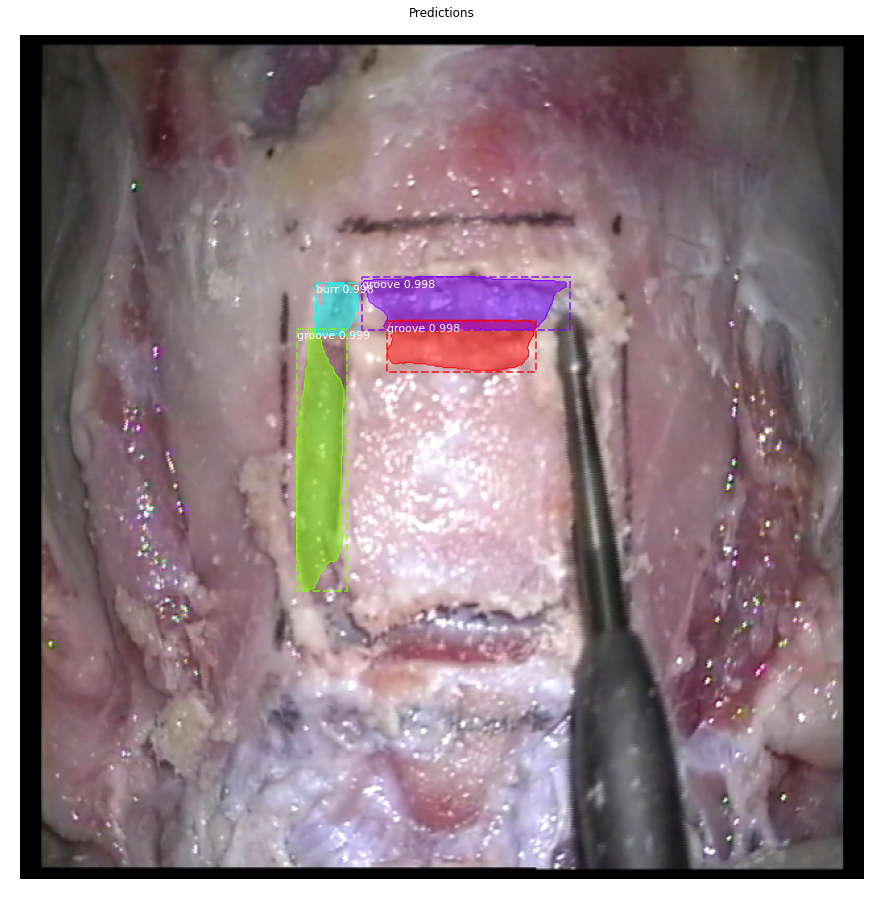

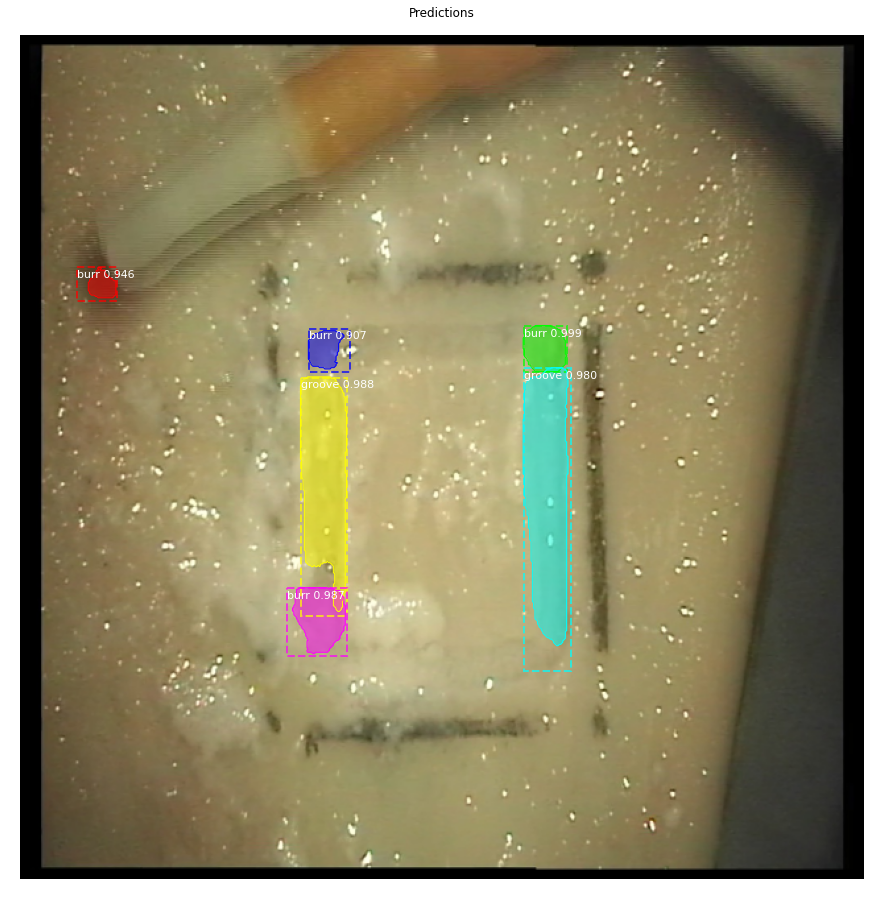

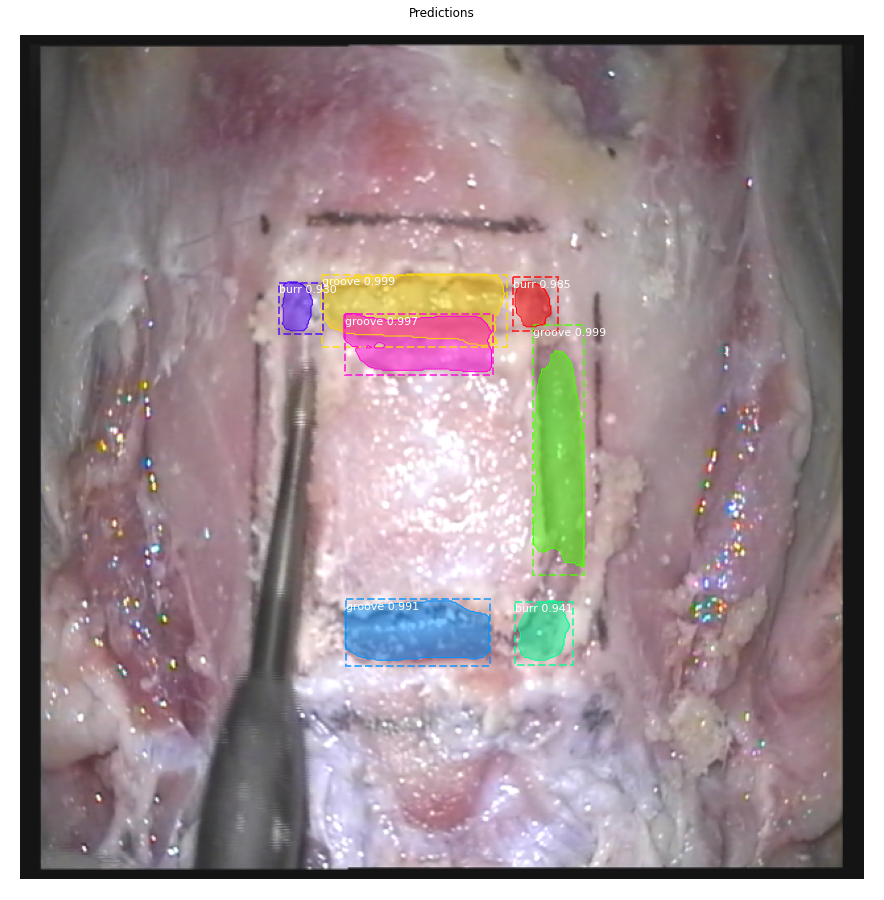

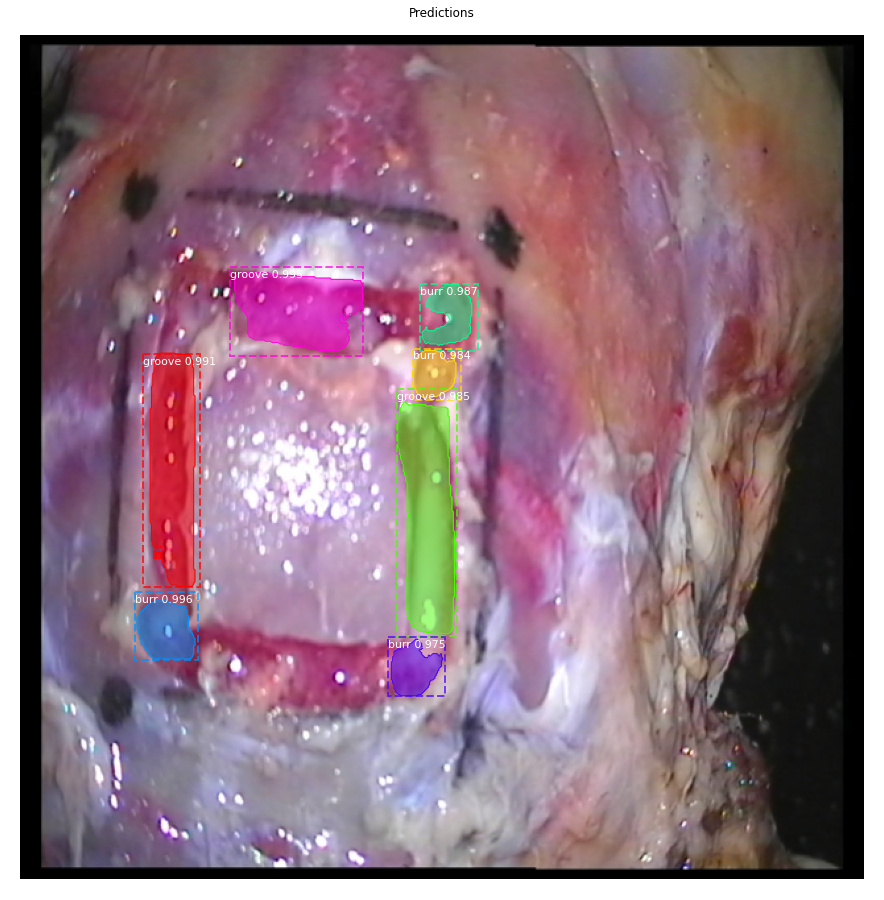

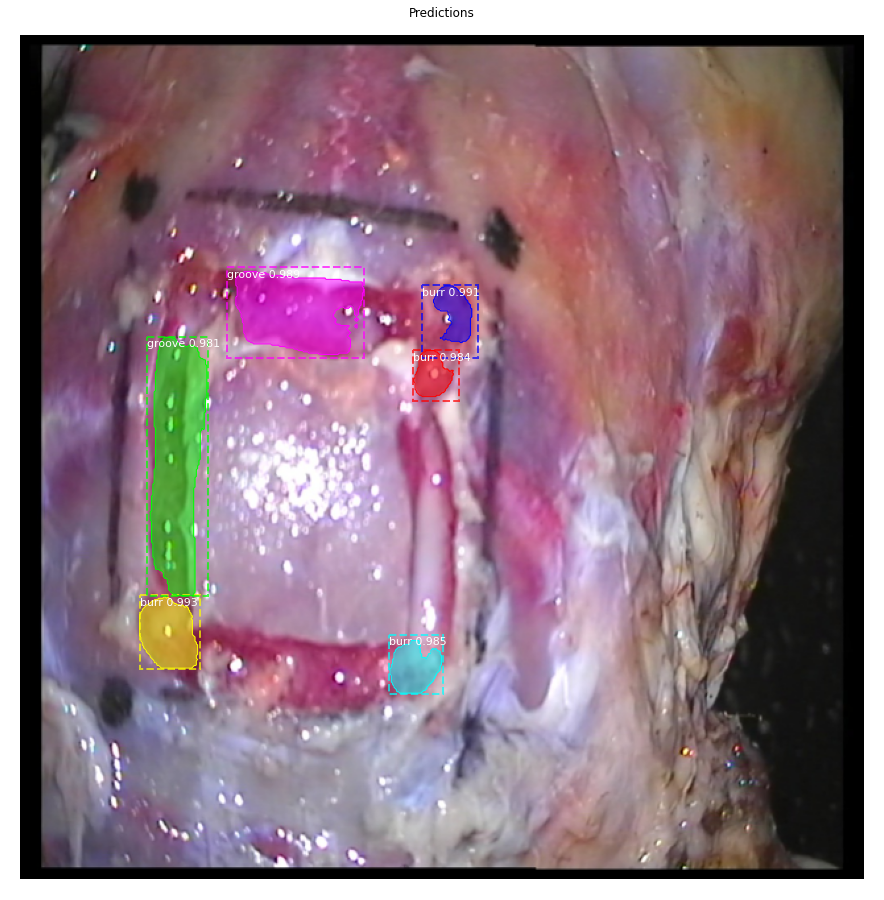

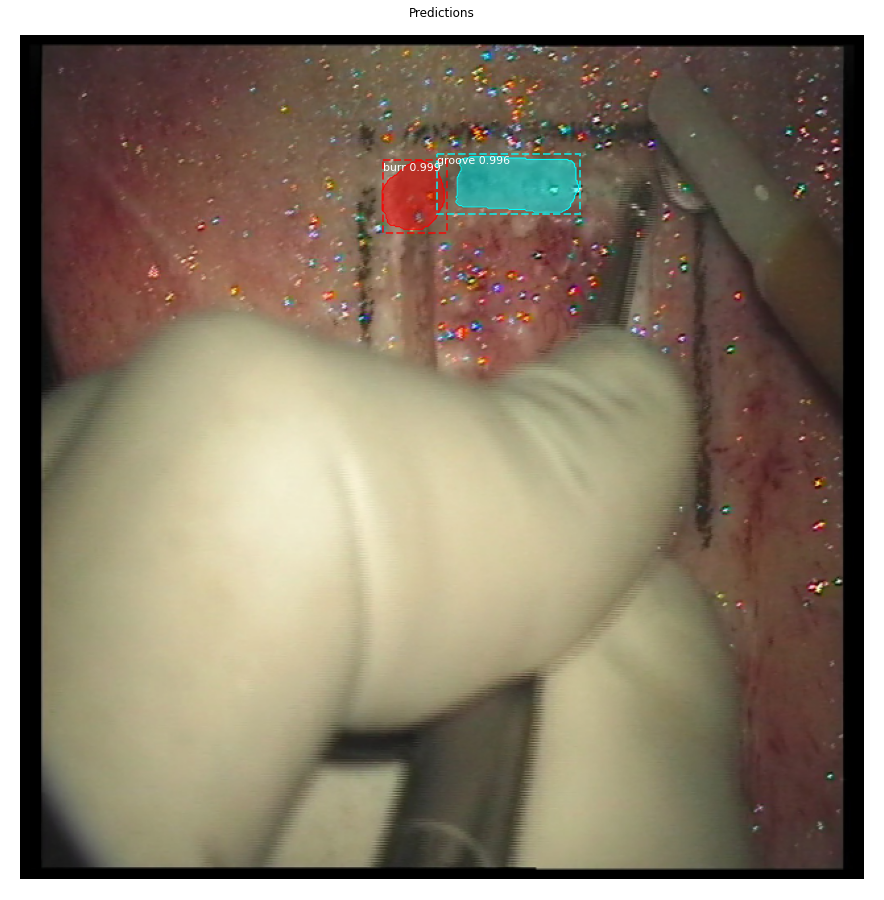

In [17]:
for _ in range(10):
    image_id = random.choice(dataset.image_ids)

    print("Image ID is : ", image_id)

    image, image_meta, gt_class_id, gt_bbox, gt_mask = \
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]

    print("Image ID : {}.{} ({}) {}".format(info["source"], info["id"], image_id, dataset.image_reference(image_id)))

    results = model.detect([image], verbose=1)

    x = get_ax(1)
    r = results[0]
    ax = plt.gca()

    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], dataset.class_names, r['scores'], ax=ax, title="Predictions")
    log("gt_class_id", gt_class_id)
    log("gt_bbox", gt_bbox)
    log("gt_mask", gt_mask)

In [18]:
from Utils_f import utils
# import utils


total_gt = np.array([]) 
total_pred = np.array([]) 
mAP_ = [] #mAP list

#compute total_gt, total_pred and mAP for each image in the test dataset
# Compute total ground truth boxes(total_gt) and total predicted boxes(total_pred) and mean average precision for each Image 
#in the test dataset
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =modellib.load_image_gt(dataset, config, image_id)#, #use_mini_mask=False)
    info = dataset.image_info[image_id]

    # Run the model
    results = model.detect([image], verbose=1)
    r = results[0]
    
    #compute gt_tot and pred_tot
    gt, pred = utils.gt_pred_lists(gt_class_id, gt_bbox, r['class_ids'], r['rois'])
    total_gt = np.append(total_gt, gt)
    total_pred = np.append(total_pred, pred)
    
    #precision_, recall_, AP_ 
    AP_, precision_, recall_, overlap_ = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
    #check if the vectors len are equal
    print("the actual length of the ground truth vect is : ", len(total_gt))
    print("the actual length of the predicted vect is : ", len(total_pred))
    
    mAP_.append(AP_)
    print("Average precision of this image : ",AP_)
    print("The actual mean average precision for the whole images", sum(mAP_)/len(mAP_))

import pandas as pd
total_gt=total_gt.astype(int)
total_pred=total_pred.astype(int)
#save the vectors of gt and pred
save_dir = "output"
gt_pred_tot_json = {"Total Groundtruth" : total_gt, "predicted box" : total_pred}
df = pd.DataFrame(gt_pred_tot_json)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
df.to_json(os.path.join(save_dir,"gt_pred_test.json"))


Processing 1 images
image                    shape: (640, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
the actual length of the ground truth vect is :  6
the actual length of the predicted vect is :  6
Average precision of this image :  0.8333333134651184
The actual mean average precision for the whole images 0.8333333134651184
Processing 1 images
image                    shape: (640, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390